<a href="https://colab.research.google.com/github/abdohamdy7/3d_obj_detection_classic_ml/blob/master/Copy_of_HW1_VLM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# HW1: Image Classification Robustness Analysis using CLIP

- **Course Name:** Vision Language Models  
- **Instructor:** Hasan Al Marzouqi   
- **Student Name:** Abdulrahman Ahmad   
- **Student ID:** 100059833    
- **Date:** April 4, 2025


## Step 1: Set up CLIP in Google Colab


In [ ]:
# Install CLIP
!pip install git+https://github.com/openai/CLIP.git
!pip install torch torchvision


  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-webzrtrz
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-webzrtrz
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 51.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 60.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 45.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
import torch
import clip
from PIL import Image

device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)


100%|███████████████████████████████████████| 338M/338M [00:08<00:00, 42.9MiB/s]


### Loading the samples of images from urls available online, then displaying them.

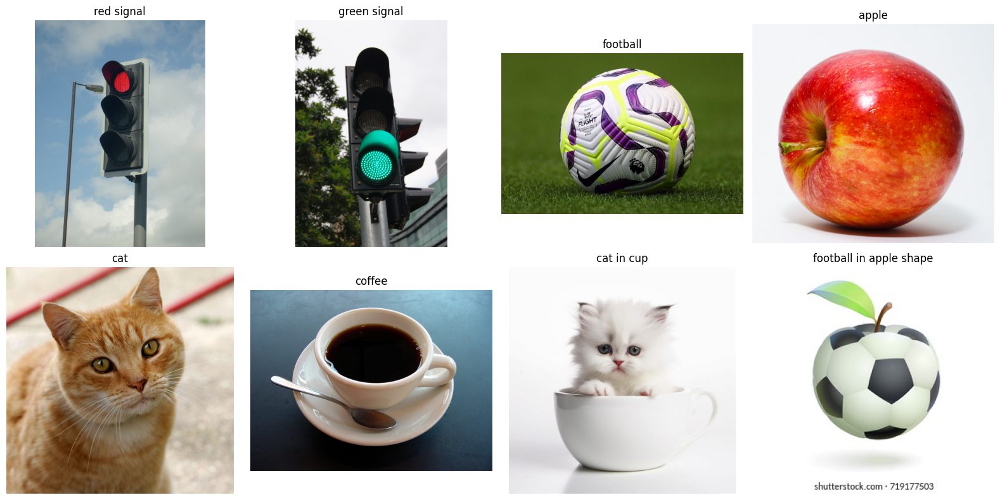

In [ ]:
images_urls = {"red signal":"https://upload.wikimedia.org/wikipedia/commons/9/91/Modern_British_LED_Traffic_Light.jpg",
               "green signal":"https://upload.wikimedia.org/wikipedia/commons/thumb/d/db/Green_traffic_signal%2C_Stamford_Road%2C_Singapore_-_20111210-02.jpg/2592px-Green_traffic_signal%2C_Stamford_Road%2C_Singapore_-_20111210-02.jpg",
               "football":"https://ichef.bbci.co.uk/ace/standard/1024/cpsprodpb/6a57/live/722993e0-58bf-11ef-b2d2-cdb23d5d7c5b.jpg",
               "apple": "https://upload.wikimedia.org/wikipedia/commons/1/15/Red_Apple.jpg",
               "cat": "https://upload.wikimedia.org/wikipedia/commons/3/3a/Cat03.jpg",
               "coffee": "https://upload.wikimedia.org/wikipedia/commons/4/45/A_small_cup_of_coffee.JPG",
               "cat in cup": "https://img.freepik.com/premium-photo/white-cat-with-blue-eyes-sits-cup_899870-5441.jpg",
               "football in apple shape":"https://www.shutterstock.com/image-vector/unique-soccer-apple-creative-fruit-260nw-719177503.jpg"

               }
import requests
from PIL import Image, UnidentifiedImageError
from io import BytesIO
import matplotlib.pyplot as plt

headers = {
    "User-Agent": "Mozilla/5.0"
}

images = []
labels = []

for label, url in images_urls.items():
    try:
        response = requests.get(url, headers=headers, timeout=10)
        response.raise_for_status()
        image = Image.open(BytesIO(response.content)).convert("RGB")
        images.append(image)
        labels.append(label)
    except (requests.exceptions.RequestException, UnidentifiedImageError) as e:
        print(f"Could not load image for label: {label} — {e}")

# Show images in 2 rows
num_images = len(images)
cols = (num_images + 1) // 2  # ceil division to determine columns for 2 rows
rows = 2

fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))
axes = axes.flatten()

for idx, (img, label) in enumerate(zip(images, labels)):
    axes[idx].imshow(img)
    axes[idx].axis('off')
    axes[idx].set_title(label)

# Hide any unused subplots
for j in range(idx + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


### writing 3 different prompts to each image in a form of a dictionary such that the key is the label of the image and the value is a list of 3 text prompts.

In [ ]:

text_prompts = {
    "red signal": [
        "a red traffic light",
        "a traffic light showing stop",
        "an illuminated red signal on the road"
    ],
    "green signal": [
        "a green traffic light",
        "a traffic light showing go",
        "an illuminated green signal on the road"
    ],
    "football": [
        "a football",
        "a soccer ball on the field",
        "a sports ball used in football matches"
    ],
    "apple": [
        "a red apple",
        "a juicy apple",
        "a piece of fruit on a table"
    ],
    "cat": [
        "a cat",
        "a domestic cat sitting",
        "a photo of a furry feline"
    ],
    "coffee": [
        "a cup of coffee",
        "a hot drink in a mug",
        "a fresh coffee cup on a table"
    ],
    "cat in cup": [
        "a cat sitting in a cup",
        "a cute kitten inside a mug",
        "a photo of a cat in a coffee cup"
    ],
    "football in apple shape": [
        "a football shaped like an apple",
        "an apple designed like a soccer ball",
        "a creative illustration of a fruit football"
    ]
}


### - Investigating the performance of clip for classifying each image with the corresponding prompt. In this experiments, we show the top-3 predictions

In [ ]:
import torch
import clip
from PIL import Image
import requests
from io import BytesIO

# Load CLIP
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

# Flatten all prompts
all_prompts = [prompt for prompts in text_prompts.values() for prompt in prompts]
text_tokens = clip.tokenize(all_prompts).to(device)

# Encode all prompts
with torch.no_grad():
    text_features = model.encode_text(text_tokens)

# Inference on each image
for label, url in images_urls.items():
    try:
        print(f"\n# Image Label: {label}")

        # Load and preprocess image
        response = requests.get(url, headers={"User-Agent": "Mozilla/5.0"}, timeout=10)
        image = Image.open(BytesIO(response.content)).convert("RGB")
        image_input = preprocess(image).unsqueeze(0).to(device)

        # Encode image
        with torch.no_grad():
            image_features = model.encode_image(image_input)

            # Compute similarity
            logits_per_image, _ = model(image_input, text_tokens)
            probs = logits_per_image.softmax(dim=-1).cpu().numpy()

        # Find top 3 predictions
        top_indices = probs[0].argsort()[-3:][::-1]
        for i in top_indices:
            print(f" {all_prompts[i]} — {probs[0][i]:.2%}")

    except Exception as e:
        print(f"Failed to process {label}: {e}")



# Image Label: red signal
 an illuminated red signal on the road — 36.25%
 a traffic light showing stop — 25.13%
 a traffic light showing go — 19.49%

# Image Label: green signal
 an illuminated green signal on the road — 33.43%
 a traffic light showing go — 27.32%
 a green traffic light — 20.13%

# Image Label: football
 a soccer ball on the field — 58.01%
 a sports ball used in football matches — 27.05%
 a football — 7.55%

# Image Label: apple
 a red apple — 33.15%
 a juicy apple — 27.28%
 an apple designed like a soccer ball — 19.36%

# Image Label: cat
 a domestic cat sitting — 65.76%
 a photo of a furry feline — 30.71%
 a cat — 3.18%

# Image Label: coffee
 a cup of coffee — 48.53%
 a fresh coffee cup on a table — 44.02%
 a hot drink in a mug — 5.41%

# Image Label: cat in cup
 a cute kitten inside a mug — 49.32%
 a photo of a cat in a coffee cup — 46.14%
 a cat sitting in a cup — 3.85%

# Image Label: football in apple shape
 an apple designed like a soccer ball — 77.87%
 a foo

### - This is another experiment to show if the generated text matches the label


Image: red signal
Top prediction: an illuminated red signal on the road
✅ Correct!

Image: green signal
Top prediction: an illuminated green signal on the road
✅ Correct!

Image: football
Top prediction: a soccer ball on the field
❌ Incorrect

Image: apple
Top prediction: a red apple
✅ Correct!

Image: cat
Top prediction: a domestic cat sitting
✅ Correct!

Image: coffee
Top prediction: a cup of coffee
✅ Correct!

Image: cat in cup
Top prediction: a cute kitten inside a mug
❌ Incorrect

Image: football in apple shape
Top prediction: an apple designed like a soccer ball
❌ Incorrect


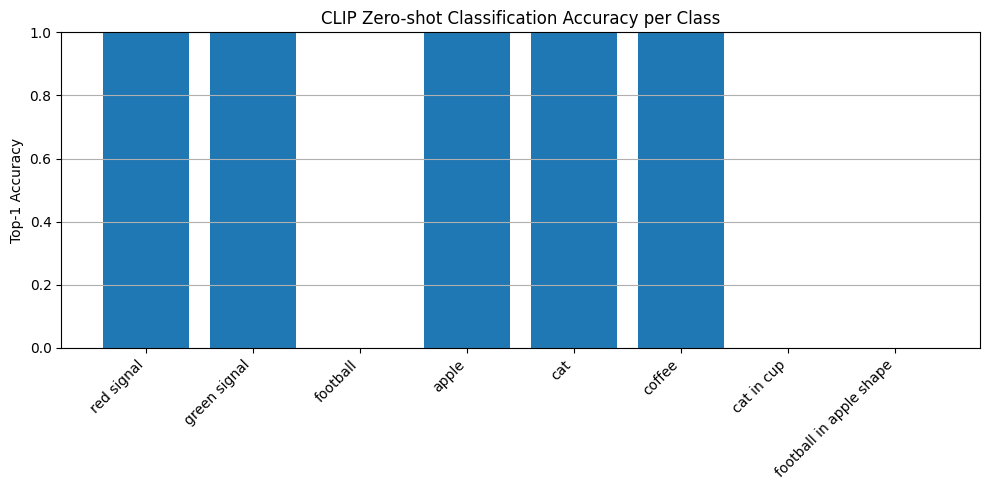

In [ ]:
import torch
import clip
from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt

# Load model
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

# Prepare text
all_prompts = [prompt for prompts in text_prompts.values() for prompt in prompts]
text_tokens = clip.tokenize(all_prompts).to(device)

with torch.no_grad():
    text_features = model.encode_text(text_tokens)

# For recording performance
correct_per_class = {}
total_per_class = {}

# Evaluate each image
for label, url in images_urls.items():
    try:
        response = requests.get(url, headers={"User-Agent": "Mozilla/5.0"}, timeout=10)
        image = Image.open(BytesIO(response.content)).convert("RGB")
        image_input = preprocess(image).unsqueeze(0).to(device)

        with torch.no_grad():
            image_features = model.encode_image(image_input)
            logits_per_image, _ = model(image_input, text_tokens)
            probs = logits_per_image.softmax(dim=-1).cpu().numpy()

        # Get best matching prompt
        best_idx = probs[0].argmax()
        best_prompt = all_prompts[best_idx]

        # Check if the top prediction contains the correct class keyword
        is_correct = label in best_prompt.lower()

        # Update stats
        correct_per_class[label] = correct_per_class.get(label, 0) + int(is_correct)
        total_per_class[label] = total_per_class.get(label, 0) + 1

        print(f"\nImage: {label}")
        print(f"Top prediction: {best_prompt}")
        print("✅ Correct!" if is_correct else "❌ Incorrect")

    except Exception as e:
        print(f"⚠️ Failed to process {label}: {e}")

# Plot performance
labels = list(correct_per_class.keys())
accuracy = [correct_per_class[label] / total_per_class[label] for label in labels]

plt.figure(figsize=(10, 5))
plt.bar(labels, accuracy)
plt.xticks(rotation=45, ha='right')
plt.ylim(0, 1)
plt.ylabel("Top-1 Accuracy")
plt.title("CLIP Zero-shot Classification Accuracy per Class")
plt.grid(axis='y')
plt.tight_layout()
plt.show()


### -This is to visualize the top-3 predictions of text prompt of the CLIP model.

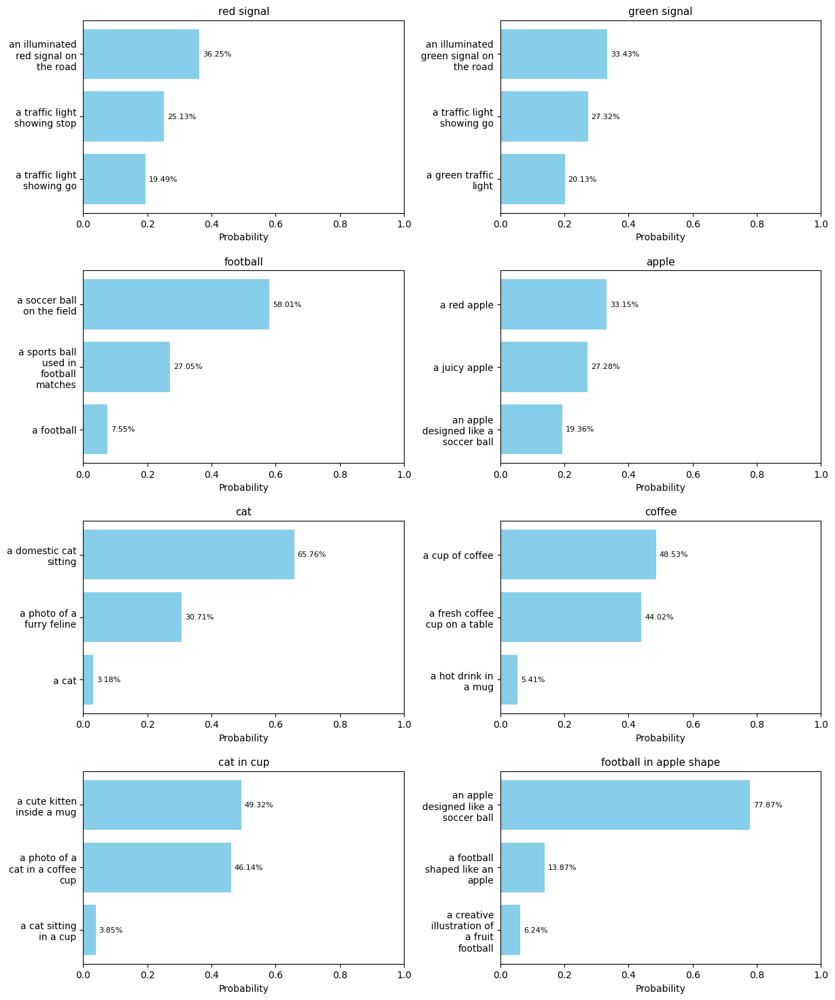

In [ ]:
import torch
import clip
from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt

# Load CLIP
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

# Tokenize prompts
all_prompts = [prompt for prompts in text_prompts.values() for prompt in prompts]
text_tokens = clip.tokenize(all_prompts).to(device)

# Encode text prompts
with torch.no_grad():
    text_features = model.encode_text(text_tokens)

# Create a 4x2 grid for bar charts
fig, axes = plt.subplots(4, 2, figsize=(14, 18))  # Larger figure for clarity
axes = axes.flatten()

# Loop through images
for idx, (label, url) in enumerate(images_urls.items()):
    try:
        response = requests.get(url, headers={"User-Agent": "Mozilla/5.0"}, timeout=10)
        image = Image.open(BytesIO(response.content)).convert("RGB")
        image_input = preprocess(image).unsqueeze(0).to(device)

        with torch.no_grad():
            image_features = model.encode_image(image_input)
            logits_per_image, _ = model(image_input, text_tokens)
            probs = logits_per_image.softmax(dim=-1).cpu().numpy()[0]

        # Get top-3 predictions
        top_indices = probs.argsort()[-3:][::-1]
        top_probs = [probs[i] for i in top_indices]
        top_prompts = [all_prompts[i] for i in top_indices]

        # Plot
        import textwrap

        # Wrap long prompts
        wrapped_prompts = [textwrap.fill(p, width=15) for p in top_prompts]

        # Plot
        ax = axes[idx]
        bars = ax.barh(wrapped_prompts[::-1], top_probs[::-1], color="skyblue")

        ax.set_xlim(0, 1)
        ax.set_xlabel("Probability")
        ax.set_title(f"{label}", fontsize=11)

        for bar in bars:
            width = bar.get_width()
            ax.text(width + 0.01, bar.get_y() + bar.get_height()/2, f"{width:.2%}", va='center', fontsize=8)

    except Exception as e:
        print(f"⚠️ Error processing {label}: {e}")

# Turn off unused axes
for i in range(idx + 1, len(axes)):
    axes[i].axis('off')

# 🔧 Adjust spacing between rows and columns
plt.subplots_adjust(hspace=0.3, wspace=0.3)

plt.show()


### this code to implement the effects to be applied on the image

In [ ]:
import numpy as np
from PIL import ImageEnhance
import torchvision.transforms as T

# Choose base image and second image to fuse
base_label = "cat in cup"
fuse_label = "coffee"

# Load both images
def load_image(url):
    response = requests.get(url, headers={"User-Agent": "Mozilla/5.0"}, timeout=10)
    return Image.open(BytesIO(response.content)).convert("RGB").resize((224, 224))

img_original = load_image(images_urls[base_label])
img_to_fuse = load_image(images_urls[fuse_label])

# Apply Modifications
def add_noise(img, noise_level=25):
    np_img = np.array(img).astype(np.float32)
    noise = np.random.normal(0, noise_level, np_img.shape)
    noisy = np.clip(np_img + noise, 0, 255).astype(np.uint8)
    return Image.fromarray(noisy)

def change_contrast(img, factor=2.0):
    enhancer = ImageEnhance.Contrast(img)
    return enhancer.enhance(factor)

def fuse_images(img1, img2, alpha=0.5):
    return Image.blend(img1, img2, alpha)

# Create modified images
img_noise = add_noise(img_original)
img_contrast = change_contrast(img_original)
img_fused = fuse_images(img_original, img_to_fuse)

# Store for testing
modified_images = {
    "original": img_original,
    "noise added": img_noise,
    "high contrast": img_contrast,
    "fused with coffee": img_fused
}


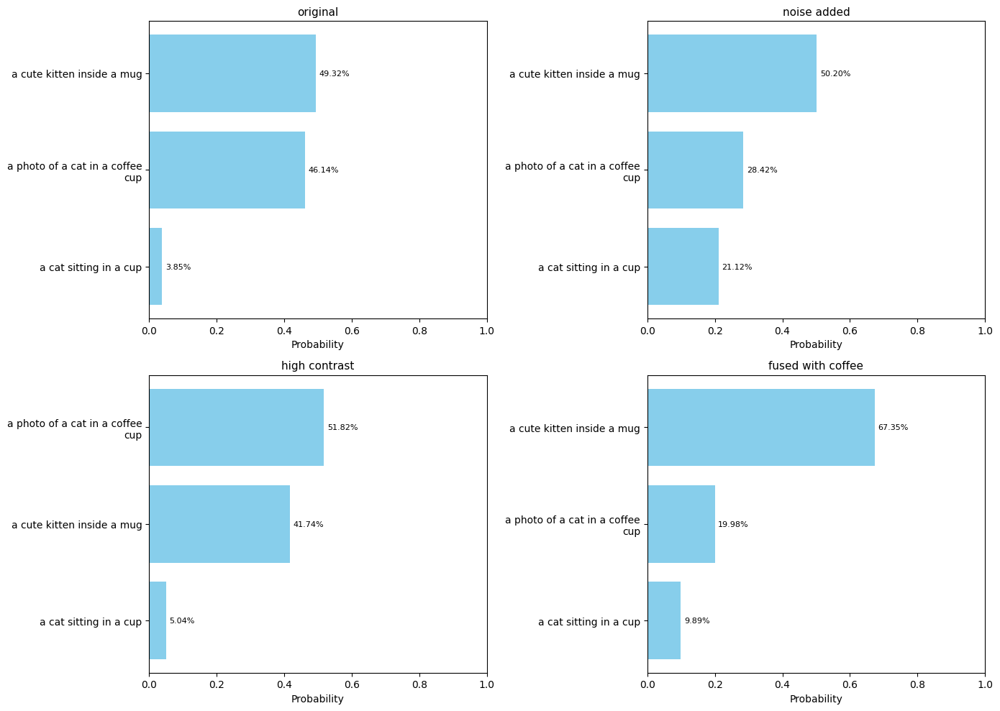

In [ ]:
# Run inference and plot results
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

for i, (name, img) in enumerate(modified_images.items()):
    image_input = preprocess(img).unsqueeze(0).to(device)

    with torch.no_grad():
        logits_per_image, _ = model(image_input, text_tokens)
        probs = logits_per_image.softmax(dim=-1).cpu().numpy()[0]

    top_indices = probs.argsort()[-3:][::-1]
    top_probs = [probs[i] for i in top_indices]
    top_prompts = [all_prompts[i] for i in top_indices]

    # Plot bar chart
    wrapped_prompts = [textwrap.fill(p, width=30) for p in top_prompts]
    ax = axes[i]
    bars = ax.barh(wrapped_prompts[::-1], top_probs[::-1], color="skyblue")
    ax.set_xlim(0, 1)
    ax.set_title(name, fontsize=11)
    ax.set_xlabel("Probability")

    for bar in bars:
        width = bar.get_width()
        ax.text(width + 0.01, bar.get_y() + bar.get_height() / 2, f"{width:.2%}", va='center', fontsize=8)

plt.tight_layout()
plt.show()


### This is a testing code to visualize the images after applying the modifications

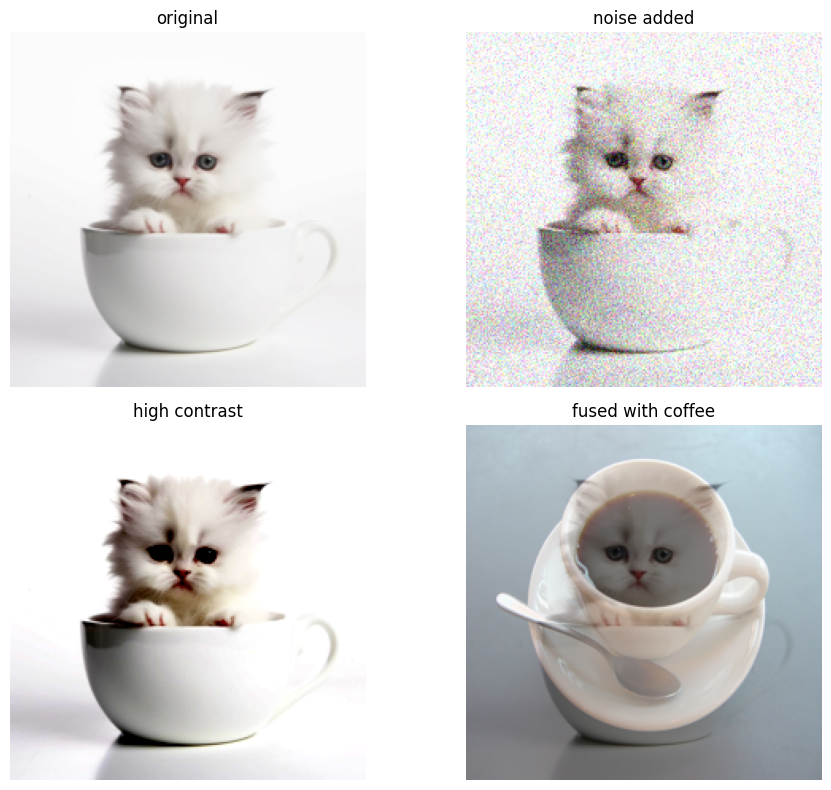

In [ ]:
# Visualize modified versions of the selected image
fig, axes = plt.subplots(2, 2, figsize=(10, 8))
axes = axes.flatten()

for i, (name, img) in enumerate(modified_images.items()):
    axes[i].imshow(img)
    axes[i].set_title(name)
    axes[i].axis('off')

plt.tight_layout()
plt.show()


### This is to improve the code to generalize and apply to all images:
a for loop to iterate over all images and apply the modifications on the image then test the performance of the clip model

### -note: we use only one text prompt to each image which is its label

In [ ]:
# Just one label per image
single_label_prompts = list(images_urls.keys())

# Tokenize once
text_tokens = clip.tokenize(single_label_prompts).to(device)


In [ ]:
def image_modify(original_img, fuse_img):
    original_img = original_img.resize((224, 224))
    fuse_img = fuse_img.resize((224, 224))

    # Noise
    np_img = np.array(original_img).astype(np.float32)
    noise = np.random.normal(0, 25, np_img.shape)
    noisy = np.clip(np_img + noise, 0, 255).astype(np.uint8)
    img_noise = Image.fromarray(noisy)

    # Contrast
    enhancer = ImageEnhance.Contrast(original_img)
    img_contrast = enhancer.enhance(2.0)

    # Fusion
    img_fused = Image.blend(original_img, fuse_img, alpha=0.5)

    return original_img, img_noise, img_contrast, img_fused


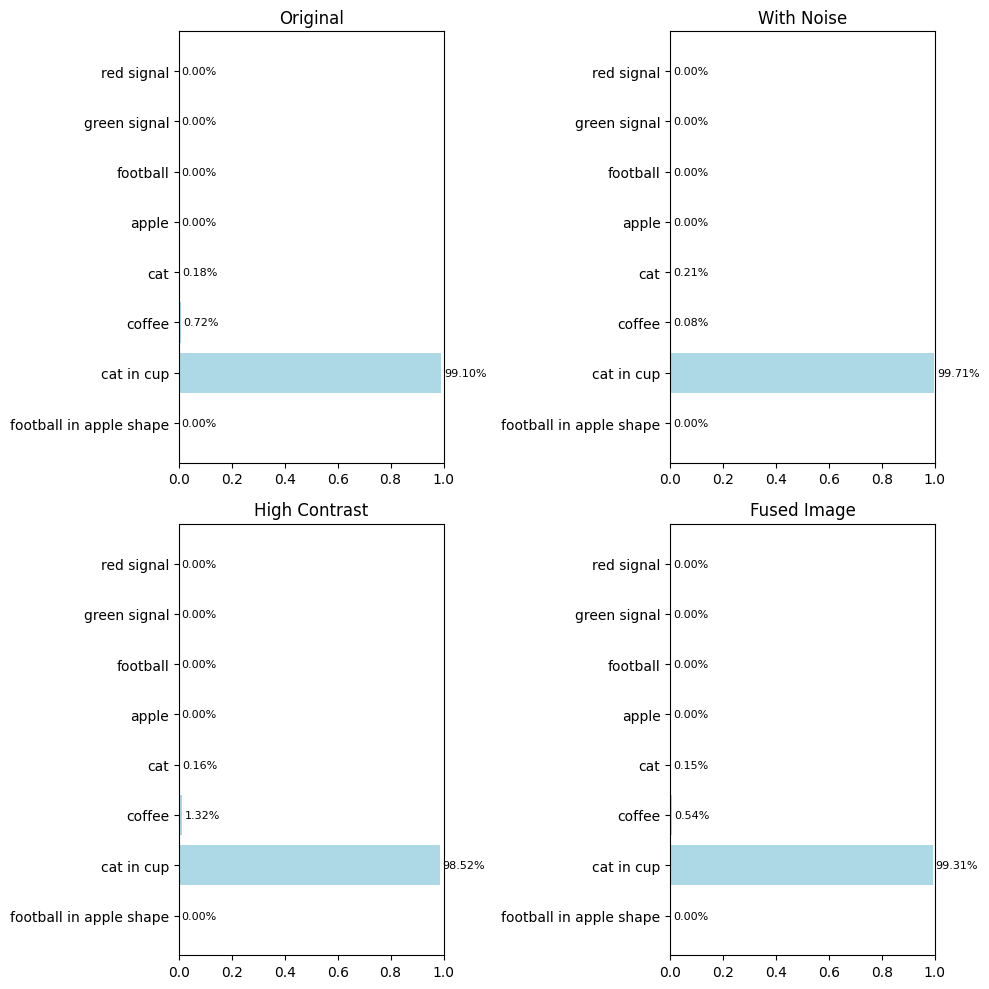

In [ ]:
import textwrap

# Choose any image key to test
target_label = "cat in cup"
target_url = images_urls[target_label]

# Pick a random image to fuse with
fuse_label = "coffee" if target_label != "coffee" else "apple"
fuse_url = images_urls[fuse_label]

# Load images
orig = Image.open(BytesIO(requests.get(target_url, headers={"User-Agent": "Mozilla/5.0"}).content)).convert("RGB")
fuse = Image.open(BytesIO(requests.get(fuse_url, headers={"User-Agent": "Mozilla/5.0"}).content)).convert("RGB")

# Get modified versions
images = image_modify(orig, fuse)
titles = ["Original", "With Noise", "High Contrast", "Fused Image"]

# Run CLIP and visualize
fig, axes = plt.subplots(2, 2, figsize=(10, 10))
axes = axes.flatten()

for i, (img, title) in enumerate(zip(images, titles)):
    image_input = preprocess(img).unsqueeze(0).to(device)

    with torch.no_grad():
        logits, _ = model(image_input, text_tokens)
        probs = logits.softmax(dim=-1).cpu().numpy()[0]

    # Plot
    ax = axes[i]
    bars = ax.barh(single_label_prompts[::-1], probs[::-1], color="lightblue")
    ax.set_xlim(0, 1)
    ax.set_title(title)

    for bar, prob in zip(bars, probs[::-1]):
        ax.text(prob + 0.01, bar.get_y() + bar.get_height()/2, f"{prob:.2%}", va='center', fontsize=8)

plt.tight_layout()
plt.show()



🔍 Processing image: red signal


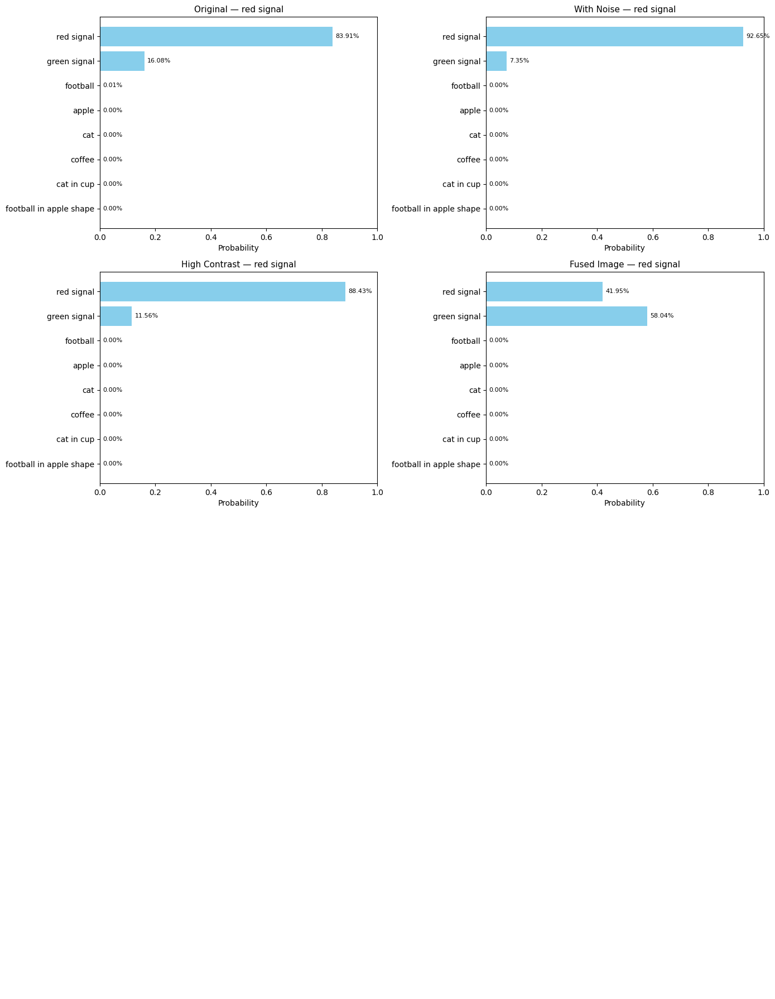


🔍 Processing image: green signal


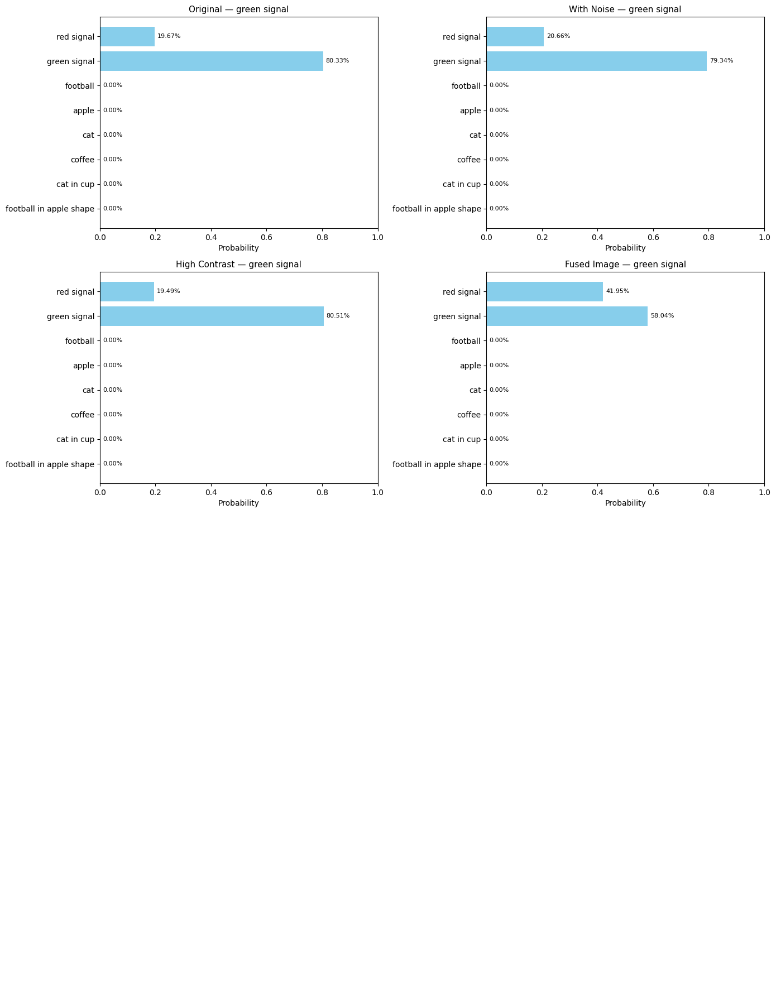


🔍 Processing image: football


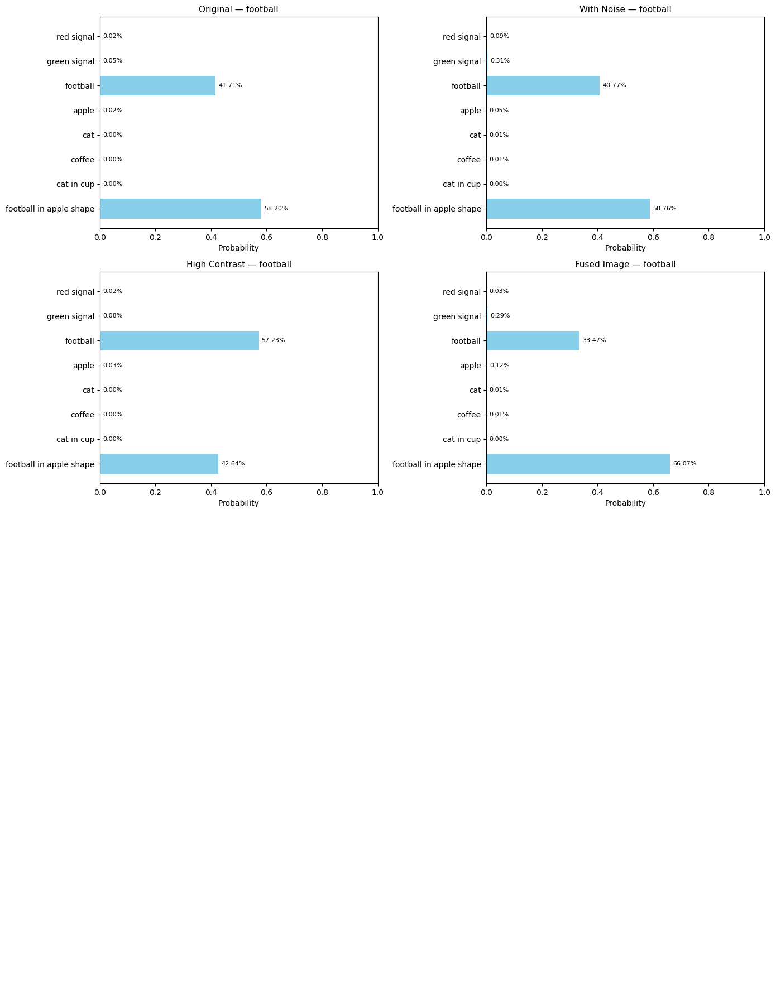


🔍 Processing image: apple


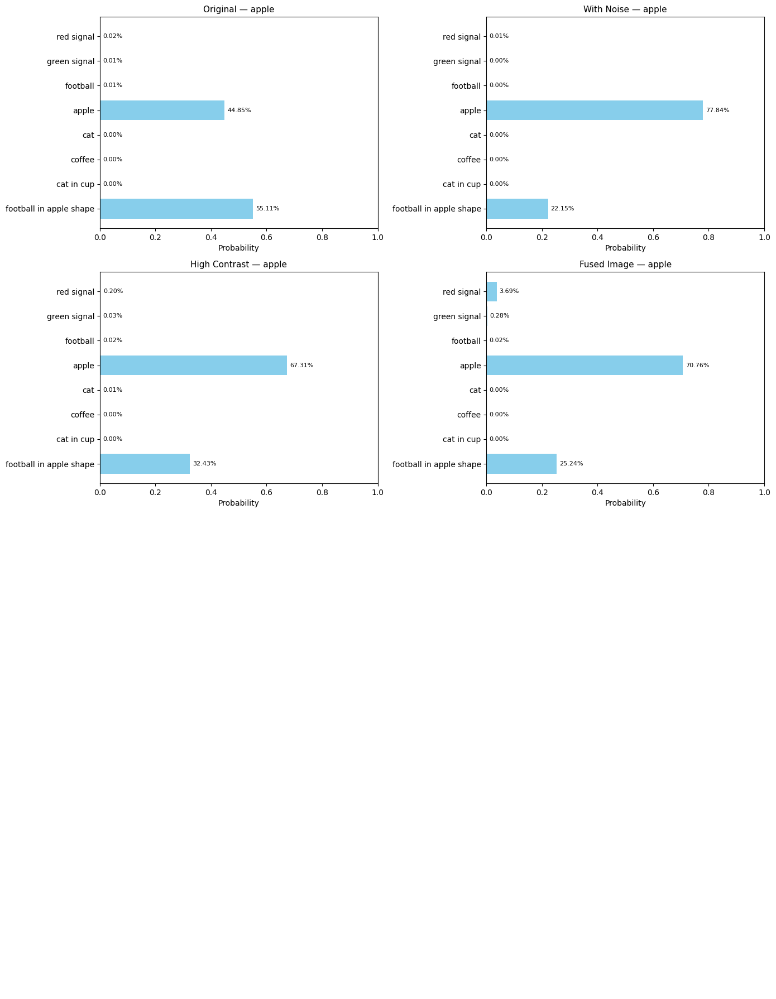


🔍 Processing image: cat


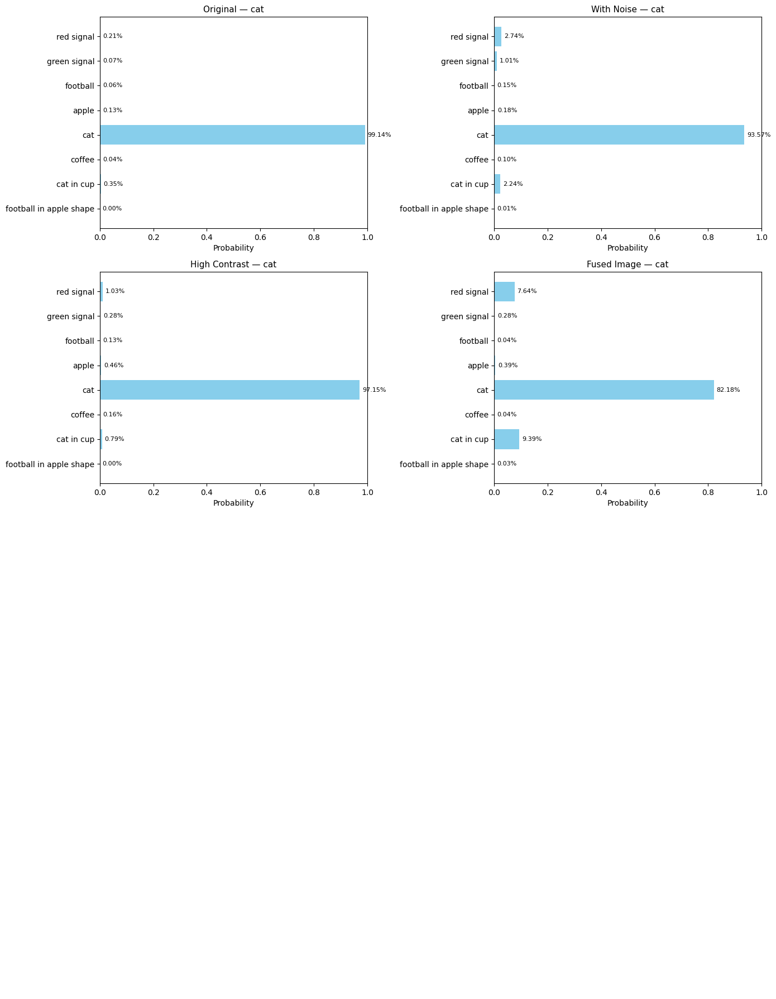


🔍 Processing image: coffee


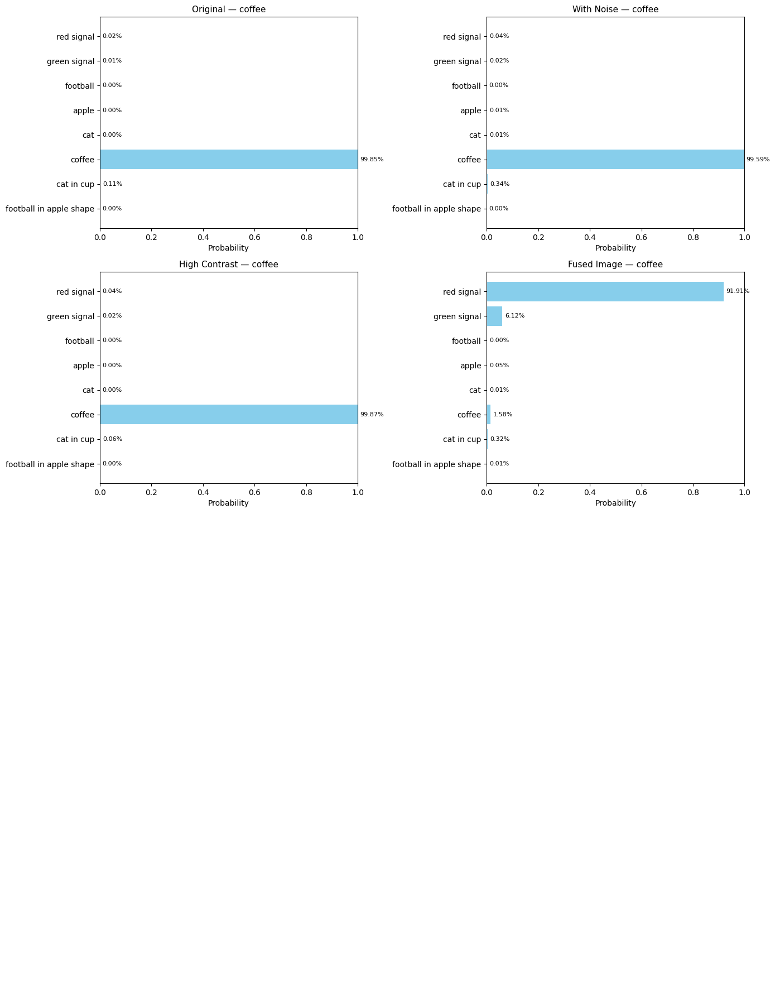


🔍 Processing image: cat in cup


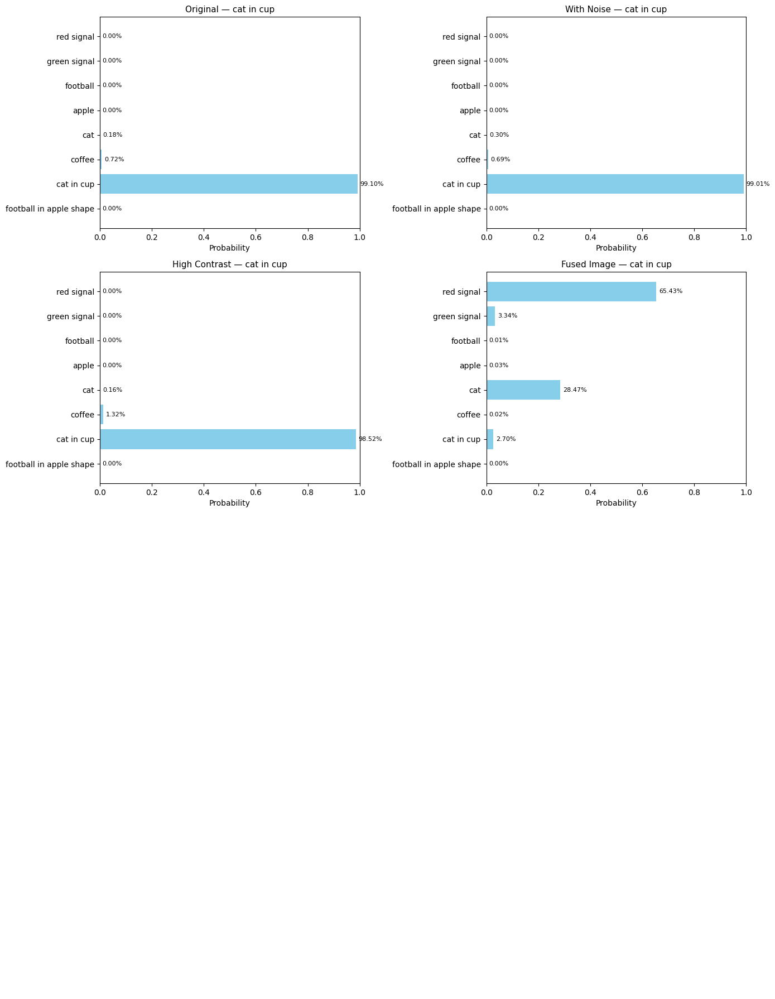


🔍 Processing image: football in apple shape


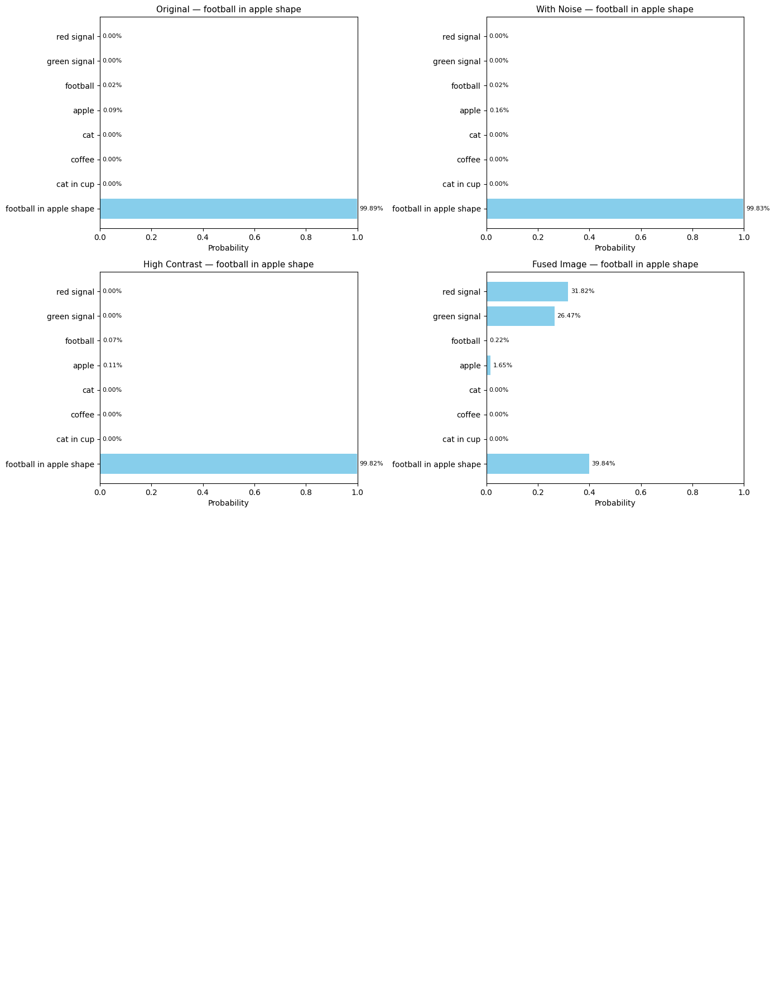

In [ ]:
import torch
import clip
import requests
import numpy as np
import textwrap
from PIL import Image, ImageEnhance
from io import BytesIO
import matplotlib.pyplot as plt

# Load CLIP
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

# Set 1 label per image
single_label_prompts = list(images_urls.keys())
text_tokens = clip.tokenize(single_label_prompts).to(device)

# Encode all text labels once
with torch.no_grad():
    text_features = model.encode_text(text_tokens)

# Image modification function
def image_modify(original_img, fuse_img):
    original_img = original_img.resize((224, 224))
    fuse_img = fuse_img.resize((224, 224))

    # Noise
    np_img = np.array(original_img).astype(np.float32)
    noise = np.random.normal(0, 25, np_img.shape)
    noisy = np.clip(np_img + noise, 0, 255).astype(np.uint8)
    img_noise = Image.fromarray(noisy)

    # Contrast
    enhancer = ImageEnhance.Contrast(original_img)
    img_contrast = enhancer.enhance(2.0)

    # Fusion
    img_fused = Image.blend(original_img, fuse_img, alpha=0.5)

    return original_img, img_noise, img_contrast, img_fused

# For each image in the dataset
for target_label in images_urls.keys():
    print(f"\n🔍 Processing image: {target_label}")

    # Select fuse image
    fuse_label = next(lbl for lbl in images_urls if lbl != target_label)
    target_url = images_urls[target_label]
    fuse_url = images_urls[fuse_label]

    # Load images
    orig = Image.open(BytesIO(requests.get(target_url, headers={"User-Agent": "Mozilla/5.0"}).content)).convert("RGB")
    fuse = Image.open(BytesIO(requests.get(fuse_url, headers={"User-Agent": "Mozilla/5.0"}).content)).convert("RGB")

    # Apply modifications
    modified_images = image_modify(orig, fuse)
    titles = ["Original", "With Noise", "High Contrast", "Fused Image"]

    # Prepare 4x2 grid of plots
    fig, axes = plt.subplots(4, 2, figsize=(14, 18))
    axes = axes.flatten()

    for i, (img, title) in enumerate(zip(modified_images, titles)):
        image_input = preprocess(img).unsqueeze(0).to(device)

        with torch.no_grad():
            logits, _ = model(image_input, text_tokens)
            probs = logits.softmax(dim=-1).cpu().numpy()[0]

        # Plot bar chart
        ax = axes[i]
        bars = ax.barh(single_label_prompts[::-1], probs[::-1], color="skyblue")
        ax.set_xlim(0, 1)
        ax.set_title(f"{title} — {target_label}", fontsize=11)
        ax.set_xlabel("Probability")

        # Add probability labels
        for bar, prob in zip(bars, probs[::-1]):
            ax.text(prob + 0.01, bar.get_y() + bar.get_height()/2, f"{prob:.2%}", va='center', fontsize=8)

    # Hide extra axes (in case fewer than 8)
    for j in range(i+1, len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    plt.show()



🖼️ Showing modified versions for: red signal


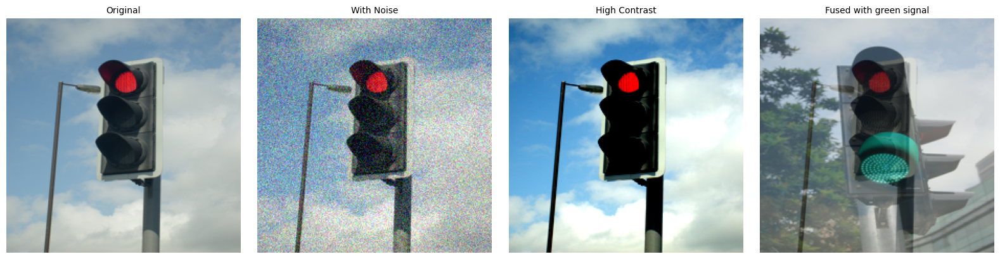


🖼️ Showing modified versions for: green signal


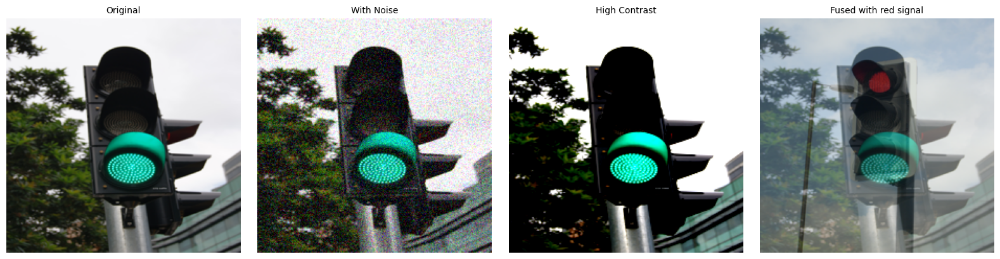


🖼️ Showing modified versions for: football


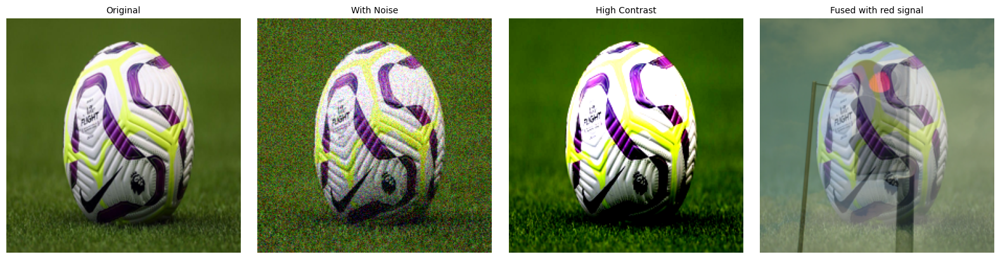


🖼️ Showing modified versions for: apple


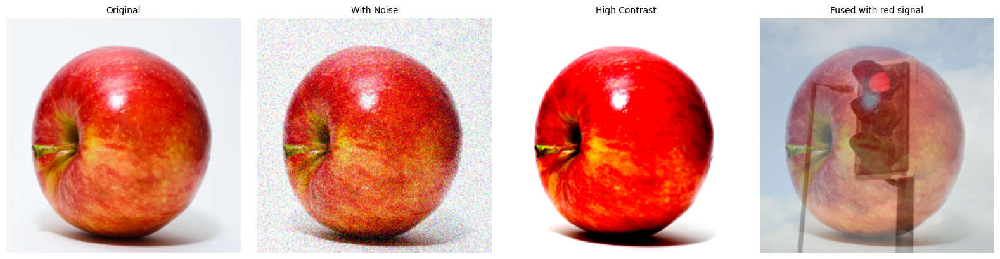


🖼️ Showing modified versions for: cat


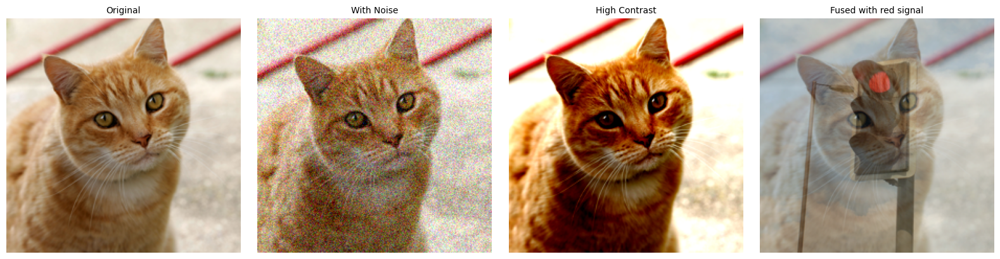


🖼️ Showing modified versions for: coffee


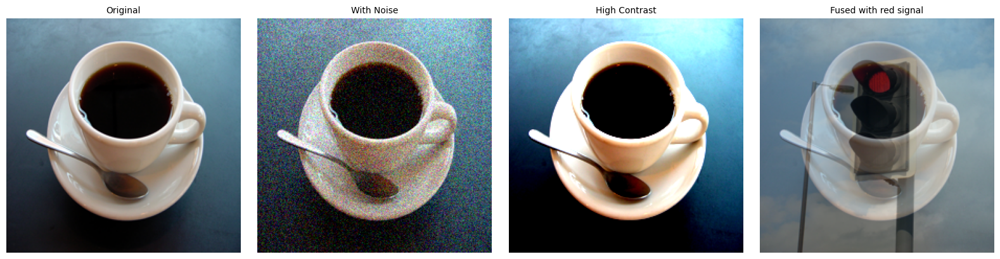


🖼️ Showing modified versions for: cat in cup


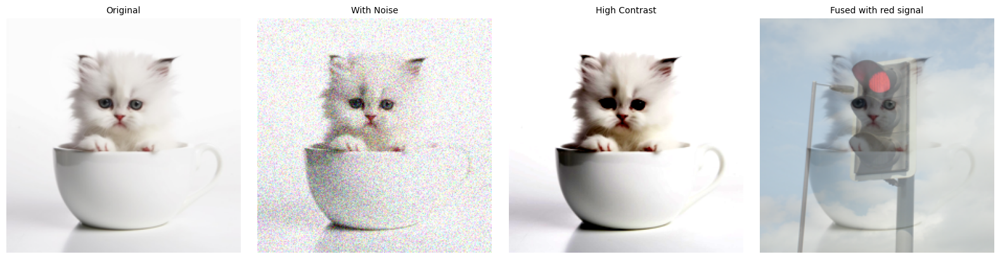


🖼️ Showing modified versions for: football in apple shape


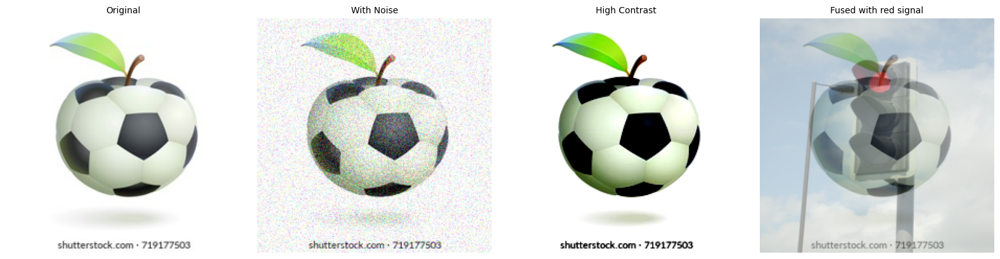

In [ ]:
# Display 4 versions (original + 3 modifications) for each image
for target_label in images_urls.keys():
    print(f"\n🖼️ Showing modified versions for: {target_label}")

    # Pick another image to fuse with (any image that's not the current one)
    fuse_label = next(lbl for lbl in images_urls if lbl != target_label)
    target_url = images_urls[target_label]
    fuse_url = images_urls[fuse_label]

    # Load and modify images
    orig = Image.open(BytesIO(requests.get(target_url, headers={"User-Agent": "Mozilla/5.0"}).content)).convert("RGB")
    fuse = Image.open(BytesIO(requests.get(fuse_url, headers={"User-Agent": "Mozilla/5.0"}).content)).convert("RGB")
    modified_images = image_modify(orig, fuse)
    titles = ["Original", "With Noise", "High Contrast", "Fused with " + fuse_label]

    # Plot the 4 versions in a row
    fig, axes = plt.subplots(1, 4, figsize=(16, 4))
    for i, (img, title) in enumerate(zip(modified_images, titles)):
        axes[i].imshow(img)
        axes[i].set_title(title, fontsize=10)
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()
